In [9]:
import numpy as np
from scipy.interpolate import interp1d
import matplotlib.pyplot as plt
import matplotlib.style as ms
ms.use('seaborn-muted')
import IPython.display
import librosa
import librosa.display
%matplotlib inline

# Load Audio

In [10]:
f_audio, fs = librosa.load('../data/brahm_hungarian-dance-05_internet-archive.mp3')

In [11]:
IPython.display.Audio(data=f_audio, rate=fs)

# Calculate Spectral Features

## Log-STFT

In [12]:
nfft = 8820
hop_size = nfft / 2
f_stft = np.abs(librosa.stft(f_audio, n_fft=nfft, hop_length=hop_size, center=True))

f_stft_ax_freq_lin = librosa.fft_frequencies(sr=fs, n_fft=nfft)
f_stft_ax_freq_log = librosa.midi_to_hz(np.arange(1, 121))

set_interp = interp1d(f_stft_ax_freq_lin, f_stft, kind='linear', axis=0)
f_pitch = set_interp(f_stft_ax_freq_log)

/Users/stibie/miniconda3/envs/py3/lib/python3.5/site-packages/numpy/core/numeric.py:482: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return array(a, dtype, copy=False, order=order)


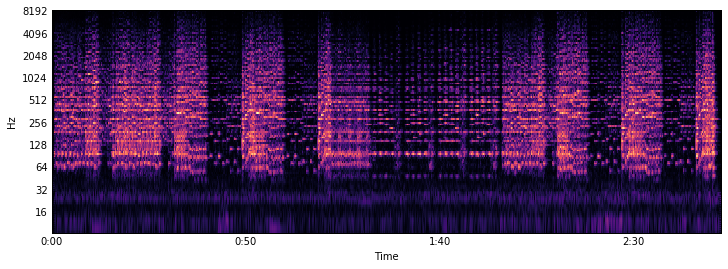

In [13]:
# Make a new figure
plt.figure(figsize=(12,4))

# Display the spectrogram on a mel scale
# sample rate and hop length parameters are used to render the time axis
librosa.display.specshow(np.log(1 + f_pitch), sr=fs, hop_length=hop_size,
                         x_axis='time', y_axis='cqt_hz',
                         fmin=librosa.midi_to_hz(1), fmax=librosa.midi_to_hz(121))

## Chroma Features

In [14]:
downsample_factor = 10
f_cens = librosa.feature.chroma_cens(C=f_pitch, sr=fs, win_len_smooth=41)
f_cens = f_cens[:, ::downsample_factor]

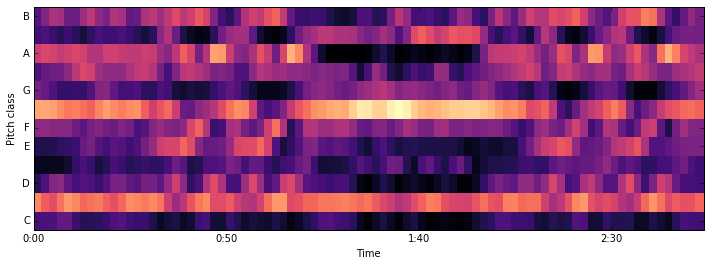

In [17]:
plt.figure(figsize=(12,4))
librosa.display.specshow(np.log(1 + f_cens), sr=fs, hop_length=hop_size * downsample_factor,
                         x_axis='time', y_axis='chroma')

# Self-Similarity Matrix

In [64]:
s = np.dot(f_cens.T, f_cens)
s /= s.max()
s = 1 - s

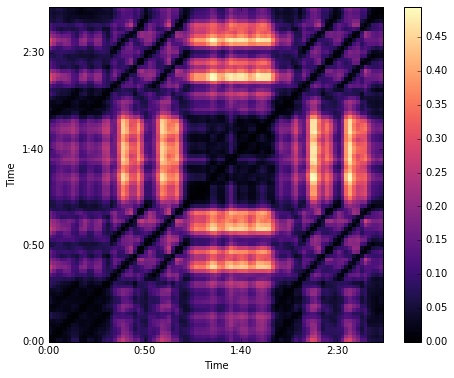

In [65]:
plt.figure(figsize=(7.5,6))
librosa.display.specshow(s, sr=fs, hop_length=hop_size * downsample_factor,
                         x_axis='time', y_axis='time')
plt.colorbar()

# Key-invariant Self-Similarity Matrix

In [84]:
key_shifts = [0, -1, 1] # np.arange(-4, 5)
n_frames = f_cens.shape[1]
s_collection = np.zeros((len(key_shifts), n_frames, n_frames))

for cur_key_shift in np.arange(len(key_shifts)):
    s_collection[cur_key_shift] = np.dot(f_cens.T, np.roll(f_cens, axis=0, shift=cur_key_shift))

# take min of all costs
s_kinv = np.min(s_collection, axis=0)
s_kinv /= s_kinv.max()
s_kinv = 1 - s_kinv

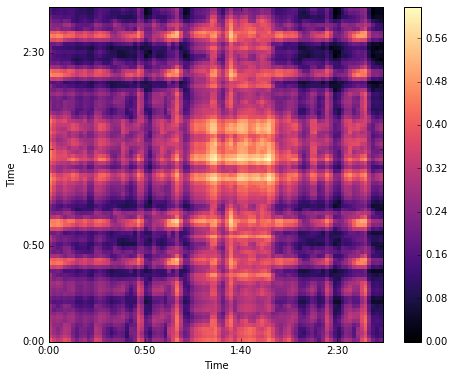

In [85]:
plt.figure(figsize=(7.5,6))
librosa.display.specshow(s_kinv, sr=fs, hop_length=hop_size * downsample_factor,
                         x_axis='time', y_axis='time')
plt.colorbar()

In [48]:
np.arange(-4, 5)

array([-4, -3, -2, -1,  0,  1,  2,  3,  4])